In [ ]:
!pip install -q google-colab

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.6 MB/s eta 0:00:00


end-to-end multiclass dog breed classification
using tensorflow 2.0 and tensorlfow hub.

1. problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at a cafe and i take a photo of a dog , want ro know what fog it is .

## 2. Data
kaggle dog breed identification competetion .
https://www.kaggle.com/c/dog-breed-identification/data
## 3. evaluation

the evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation
## 4. feature

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10000+ images in teh trainig set
* There are around 10000+ images in teh test set

Get our workspace ready
* Import Tensorflow 2.x ✅
* Import Tensorflow Hub
* Make sure we'veusing a GPU

In [ ]:
## imprt tensor flow into colab
import tensorflow as tf
print("TF version:",tf.__version__)

TF version: 2.15.0


In [ ]:
import tensorflow_hub as hub
print("TF Hb version:", hub.__version__)

TF Hb version: 0.15.0


In [ ]:
# Check for GPU availability
print("GPU","available (YESSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :()")



GPU available (YESSS!!!!)


###turning our data into tensors
machine learning models, our data has to be in numericle format, So that's what we'll be doing first. Turning our images into Tensors (numerical representations).


In [ ]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

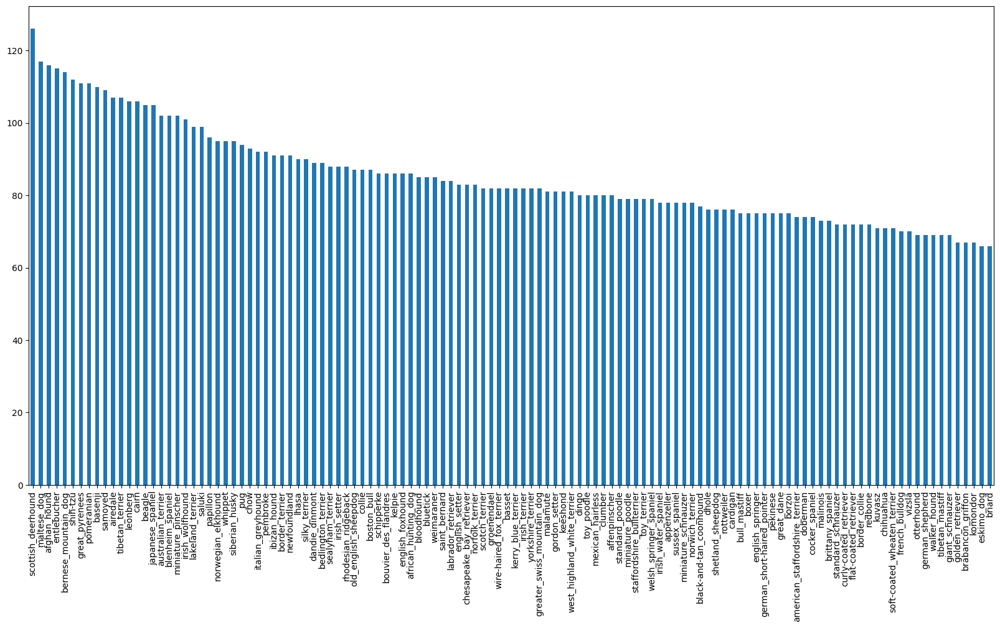

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))


In [ ]:
labels_csv["breed"].value_counts ().median()

82.0

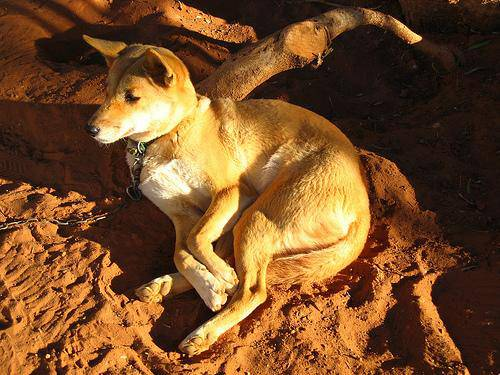

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and labels

Let's get a list of all our images file pathnames

In [ ]:
##create pathname from image id's
filenames = ["drive/MyDrive/dog vision/train/" + fname + "jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303djpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1djpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21bjpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64jpg']

In [ ]:
# check whether no. of lfile names matcehs no. of data
import os
if len(os.listdir("drive/MyDrive/dog vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target deirectory.")


Filenames match actual amount of files!!! Proceed.


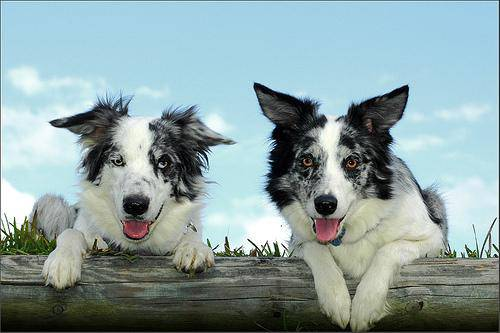

In [ ]:
# importing glob was not a part of teh tutorial
import glob

filenames = glob.glob('drive/MyDrive/dog vision/train/*.jpg')

Image(filenames[9000])

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy() # convert labels column to NumPy array
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
labels_csv["id"][9000]

'e20e32bf114141e20a1af854ca4d0ecc'

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image in a list, let's prepare our labels.

In [ ]:
labels = labels_csv["breed"].to_numpy()
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("number of labels matches number of filenames!")
else:
  print("no.of labels do not match")

number of labels matches number of filenames!


In [ ]:
import numpy as np

In [ ]:
# find the unique label values
# np.unique is used to find the unique elements in an array
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels ]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turn every label into abooean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: turning boolean array into integers
print(labels[0])# original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array

boston_bull
(array([19]),)
19


In [ ]:
print(boolean_labels[0].astype(int))# there will be one where the sample label occurs

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/dog vision/train/e297c765ac7e6c1d7c4657c7e72b1544.jpg',
 'drive/MyDrive/dog vision/train/dec0bb81afcfc4c35c7c6790975e5633.jpg',
 'drive/MyDrive/dog vision/train/e167b2451fa1a46c231f4a628800b5db.jpg',
 'drive/MyDrive/dog vision/train/dcc19db6b4e117d5e4f7d1b00fbe3982.jpg',
 'drive/MyDrive/dog vision/train/e655b500159688691e025a1177936df0.jpg',
 'drive/MyDrive/dog vision/train/e8e9ea1506e0ad9382665b2690ecb4e9.jpg',
 'drive/MyDrive/dog vision/train/e0cfa8c273838e25d74970683b285391.jpg',
 'drive/MyDrive/dog vision/train/dcfa82b89aa735341c1d5dc52f331b89.jpg',
 'drive/MyDrive/dog vision/train/df4d0576d927992df06c9bb08bb9bac7.jpg',
 'drive/MyDrive/dog vision/train/e90868c5948296e603f26b2d2696f9c7.jpg']

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## crearing our own validation set
since the dataset from kaggle does'nt come with a validation set

In [ ]:
## setup x and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We are going to start of with experimetning with -1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

#np.random.seed(42)
# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Lets's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/dog vision/train/e827e6439b32ea68d51e894a7350c699.jpg',
  'drive/MyDrive/dog vision/train/ec8ae6ea9408c47092ca95031ebc6acd.jpg',
  'drive/MyDrive/dog vision/train/f8a5dcec60ad103637c39b31d6dadaef.jpg',
  'drive/MyDrive/dog vision/train/eae07088a41c3d064b7d099b2fe63f11.jpg',
  'drive/MyDrive/dog vision/train/fdf83a2eed71f2c54c3e6f592e84b254.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## preprocessing images (turning images into tensors)
to preprocess our images into tensors we're going to write a function which does a few things :
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-2 to 0-1)
4. Resize the 'image' to be a shape of (224, 224)
5. Return the modified image .


let's see what importing an image looks like

In [ ]:
# convert image into NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(420, 500, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image

array([[[152, 151, 146],
        [154, 153, 148],
        [159, 158, 153],
        ...,
        [104, 106,  84],
        [ 99, 101,  79],
        [ 93,  95,  73]],

       [[164, 163, 158],
        [168, 167, 162],
        [177, 176, 171],
        ...,
        [115, 118,  91],
        [110, 112,  88],
        [107, 110,  83]],

       [[157, 157, 149],
        [149, 149, 141],
        [145, 146, 138],
        ...,
        [110, 116,  82],
        [107, 112,  80],
        [107, 113,  79]],

       ...,

       [[122, 125, 130],
        [121, 124, 129],
        [120, 123, 128],
        ...,
        [140, 151, 155],
        [135, 146, 148],
        [132, 143, 145]],

       [[124, 127, 132],
        [124, 127, 132],
        [126, 129, 134],
        ...,
        [140, 151, 155],
        [139, 150, 152],
        [140, 151, 153]],

       [[119, 122, 127],
        [122, 125, 130],
        [127, 130, 135],
        ...,
        [137, 148, 152],
        [140, 151, 153],
        [143, 154, 156]]

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[152, 151, 146],
        [154, 153, 148],
        [159, 158, 153],
        ...,
        [104, 106,  84],
        [ 99, 101,  79],
        [ 93,  95,  73]],

       [[164, 163, 158],
        [168, 167, 162],
        [177, 176, 171],
        ...,
        [115, 118,  91],
        [110, 112,  88],
        [107, 110,  83]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[152, 151, 146],
        [154, 153, 148],
        [159, 158, 153],
        ...,
        [104, 106,  84],
        [ 99, 101,  79],
        [ 93,  95,  73]],

       [[164, 163, 158],
        [168, 167, 162],
        [177, 176, 171],
        ...,
        [115, 118,  91],
        [110, 112,  88],
        [107, 110,  83]]], dtype=uint8)

now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Resize the 'image' to be a shape of (224, 224)
5. Return the modified image .

In [ ]:
# Define image_size
IMG_SIZE = 224

# Create a funtion for preprocesing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Take an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numericel tensor with 3 color channels (Red , green , blue)
  image = tf.io.decode_jpeg(image)
  # convert the color channel values form 0-255 to 0-1values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tf.image.decode_jpeg(tensor, channels=3)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[149, 188,  37],
        [132, 174,  26],
        [102, 153,  14],
        ...,
        [ 97,  96, 102],
        [ 96,  95, 101],
        [103, 102, 108]],

       [[116, 156,   5],
        [139, 183,  36],
        [ 97, 150,  10],
        ...,
        [ 96,  95, 100],
        [ 99,  98, 104],
        [110, 109, 114]],

       [[102, 148,   0],
        [136, 186,  37],
        [ 90, 147,   6],
        ...,
        [105, 103, 106],
        [106, 104, 109],
        [111, 109, 112]],

       ...,

       [[ 76,  69,  76],
        [ 95,  88,  95],
        [ 94,  89,  95],
        ...,
        [ 85,  51,  39],
        [ 94,  60,  48],
        [ 90,  56,  44]],

       [[135, 128, 135],
        [129, 122, 129],
        [ 83,  78,  84],
        ...,
        [ 91,  57,  45],
        [ 97,  63,  51],
        [ 92,  58,  46]],

       [[ 79,  72,  79],
        [ 91,  84,  91],
        [ 62,  57,  63],
        ...,
        [ 95,  61,  4

## turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go...
they all might not fit into memory .
So that's why we do 32(this is the batch size) images at a time(you can mannualy adjust the size of the batch if needed).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which looks like: (image, label).

In [ ]:
# Create a simple function to return a tuple (images,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tupple of (image, label)
  """
  image = process_image(image_path)
  return image, label

Now we've got a way to turn our data into tuples of Tensors in the form of: '(image, label)', let's make a function to turn all our data('X' & 'y') into batches .

In [ ]:
# DEfine the batch size, 32 is a good start
BATCH_SIZE = 32

# Create  function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print("creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepath (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # If data is a valid dataset, we don't need to shuffle it
  elif valid_data:
      print("Creating validation data batches...")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                 tf.constant(y)))# labels
      data_batch = data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch
  else:
    print("Creating training data batches...")
    # urne filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels befores mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Creating taining and validatoin dat batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### visualising Data batches

Our data is now in batches , however , these ca be hard to understand/comprehend ,lett's
visualise it

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  displays a plot of 25 imagess and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create some plots (5 rows , 5 columns )
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    # plt.axis("off")
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

len(train_images), len(train_labels)

(32, 32)

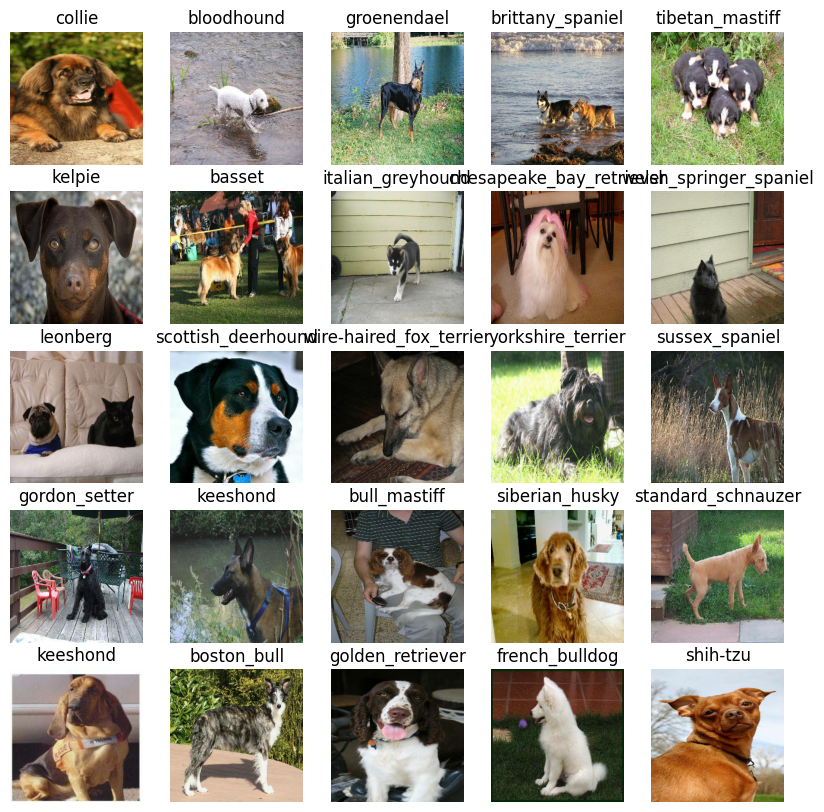

In [ ]:
# Now let's visualize thedata in trainining batch
show_25_images(train_images, train_labels)

(32, 32)

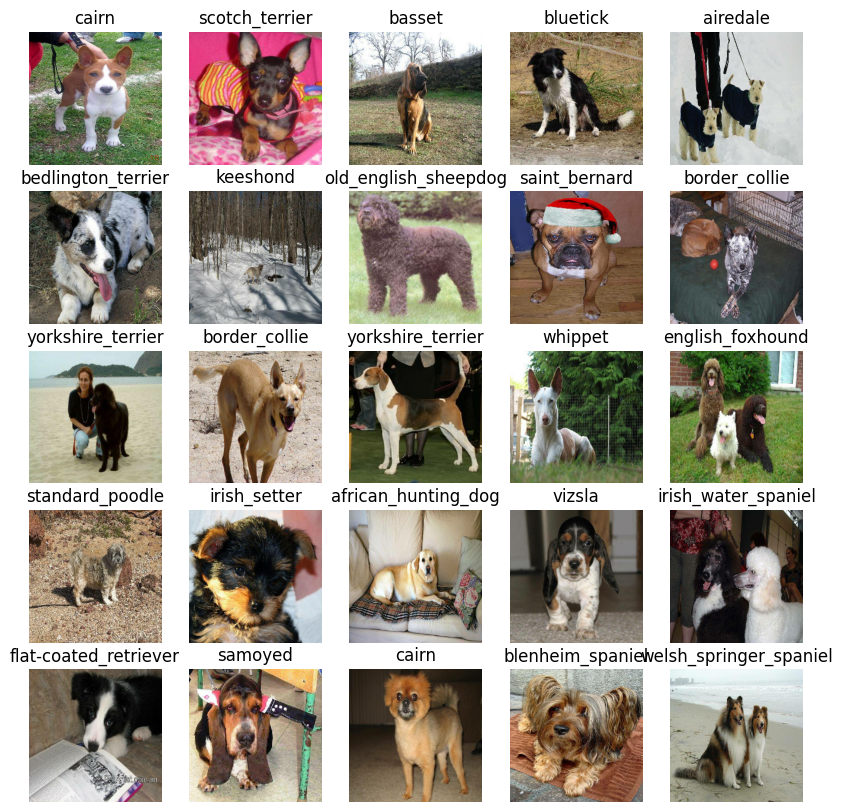

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)
len(val_images), len(val_labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Building a model
Before we build a model, there there are a few things  we need to define:
* The input shape (our images shape, in the form of tensors ) to our model.
* The output shape (Image labels, in the form of tensors) of our model.
* The URL of the model we want.
* The URL of the model we want "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Setup the input shape to the model
INPUT_SHAPE =[None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup ooutput shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
Model_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and models ready to go . Let's put them together inot a Keras deep learning model!

Knowing this, let's create a function which:
* takes input sahpe and output shape and model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion(do this first, then this then that).
*  Compiles the modle (says it should be evaluated and improved)
* Builds the model(tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here:https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras modles
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=Model_URL):
  print("Building model with:", Model_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(Model_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)

  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## creating callbacks

callbacks are helper functions a model can use during training to do such things as save its prorgress, check its progress or stop training early if a model stops improving.

We'll create two callbacks , one for TensorBorad which helps track our models progress and another for early stopping which prevents our model from training for too long .
### TensorBorad Callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. create a tensorBoard callback which is able to save logs to a directory and pass it to our model fit() function.
3. Visualize our models training logs with the %tensorboard magic function(we'll do this after model training).


In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Crete a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/dog vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working .

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100,step:10}

In [ ]:
# Check to make sure we are still running on gpu
print("GPU","available "if tf.config.list_physical_devices("GPU") else "not available")

GPU available 


Let's create a function which trains a model.
* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for callbaks we'd like to use
* return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  trains a given model and return a trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 149s 6s/step - loss: 5.6436 - accuracy: 0.0088 - val_loss: 5.6264 - val_accuracy: 0.0100
Epoch 2/100
25/25 [==============================] - 2s 97ms/step - loss: 3.7949 - accuracy: 0.1650 - val_loss: 5.6900 - val_accuracy: 0.0000e+00
Epoch 3/100
25/25 [==============================] - 4s 142ms/step - loss: 2.6708 - accuracy: 0.4212 - val_loss: 5.8628 - val_accuracy: 0.0050
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 1.8734 - accuracy: 0.6675 - val_loss: 6.0254 - val_accuracy: 0.0050


### Checking the TensorBoard logs

The TensorBoard magic function ('%tensorboard') will access the logs directory we created earlier and  visualise the contents .


In [ ]:
%tensorboard --logdir drive/MyDrive/dog\ vision/logs

<IPython.core.display.Javascript object>

## Making predictions on the trained model

In [ ]:
# Make prediction on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 74ms/step


array([[8.6868154e-03, 5.7187751e-03, 1.9503979e-02, ..., 2.1513209e-03,
        5.2426779e-04, 1.1079645e-02],
       [2.8579272e-03, 5.2918382e-03, 6.1573507e-03, ..., 1.8390378e-03,
        1.1947681e-02, 4.6072565e-03],
       [1.4310007e-02, 2.8707818e-03, 2.3401882e-03, ..., 2.3533120e-03,
        1.1712225e-03, 2.2839920e-03],
       ...,
       [5.5083842e-04, 1.2581931e-02, 2.8866082e-03, ..., 2.1850420e-03,
        8.2510523e-04, 6.3894005e-03],
       [1.5914645e-04, 1.4376669e-03, 7.4408175e-03, ..., 2.6294212e-05,
        1.8199596e-03, 8.5617510e-05],
       [4.6463136e-04, 1.2231463e-03, 2.1688170e-03, ..., 1.7066543e-03,
        5.4895515e-03, 7.3858596e-02]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
print(predictions[0])
index = 0
print(f"Max value (probability of predictions): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[8.68681539e-03 5.71877509e-03 1.95039790e-02 8.00459459e-03
 2.69725337e-04 4.02685662e-04 2.18568181e-04 6.92642108e-03
 4.05488908e-03 1.01990043e-03 6.00368017e-03 2.13003550e-02
 8.21185578e-03 3.60417576e-03 1.90500170e-02 2.91575231e-02
 6.48295693e-03 5.82706707e-04 1.41698995e-03 5.45570292e-02
 1.29626170e-02 1.30176907e-02 2.73130776e-04 1.25796499e-03
 1.27724803e-03 9.50172544e-03 8.86251777e-03 1.56069845e-02
 5.36502397e-04 5.35363192e-03 3.94541165e-03 5.53880818e-04
 1.25253137e-04 1.76651066e-03 1.90714491e-03 1.41259472e-04
 4.98087844e-04 2.86971364e-04 1.58213601e-02 1.16491399e-03
 3.10332887e-02 1.67670834e-03 1.06385582e-04 1.23644271e-03
 3.65193048e-03 1.65319862e-03 5.41114155e-03 4.32166550e-03
 4.86684701e-04 5.57951536e-03 2.66344883e-02 1.34947317e-04
 8.70173983e-03 4.87720035e-03 1.97356362e-02 4.97913803e-04
 9.56880581e-03 7.52054006e-02 6.01953710e-04 1.56476477e-03
 3.35767952e-04 5.47709642e-03 1.82808482e-03 7.59990289e-05
 3.07399197e-04 1.695849

In [ ]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we wantto be able to do it at scale
Andit would be even better if we could see the image the predicton is being made on!
Note: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respaective label (easier to understand )
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'weimaraner'

Now since our validation data is still in a batch dataset

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[6.3305326e-02, 6.0057852e-02, 7.8991599e-02],
         [1.6806956e-02, 1.5301354e-02, 3.2493234e-02],
         [2.9971989e-02, 2.6050419e-02, 4.5658261e-02],
         ...,
         [2.3287816e-01, 4.1751495e-01, 6.2385291e-01],
         [2.3467296e-01, 4.0580302e-01, 6.0770231e-01],
         [2.4726863e-01, 4.0000004e-01, 6.0392159e-01]],
 
        [[4.7706120e-02, 4.3950632e-02, 6.3392393e-02],
         [5.4201391e-04, 0.0000000e+00, 1.6228290e-02],
         [1.4467194e-02, 1.0780796e-02, 3.0153468e-02],
         ...,
         [1.7289579e-01, 3.3737403e-01, 5.1859784e-01],
         [2.0413998e-01, 3.5307193e-01, 5.4568321e-01],
         [2.2722287e-01, 3.6393508e-01, 5.4754007e-01]],
 
        [[4.5868356e-02, 4.2953044e-02, 6.1554629e-02],
         [3.6647663e-04, 5.1348943e-05, 1.6052753e-02],
         [1.0309675e-02, 7.8129722e-03, 2.5995949e-02],
         ...,
         [1.9078767e-01, 3.4056202e-01, 5.2228290e-01],
         [2.4679664e-01, 3.9527106e-01, 5.8080274e-01],


In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'weimaraner'

Now we've got ways to get:
* Prediction labels
* validation labels(truth labels)
* Validation images .

## Let's make some function to make these all a bit more visualize.
We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

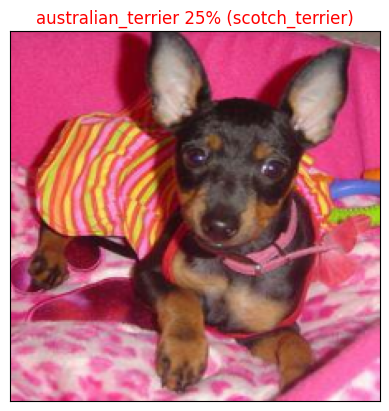

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels=val_labels,
          images=val_images)

now we've got one function to visualize our models top predictions, let's make another to view our models top 10 predictions.
This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


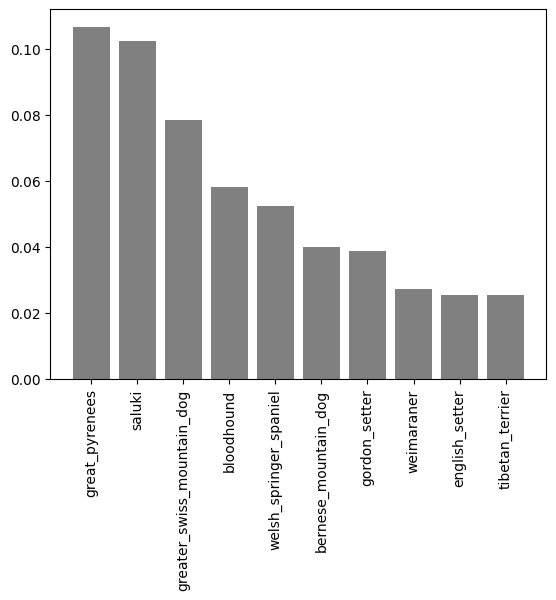

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check

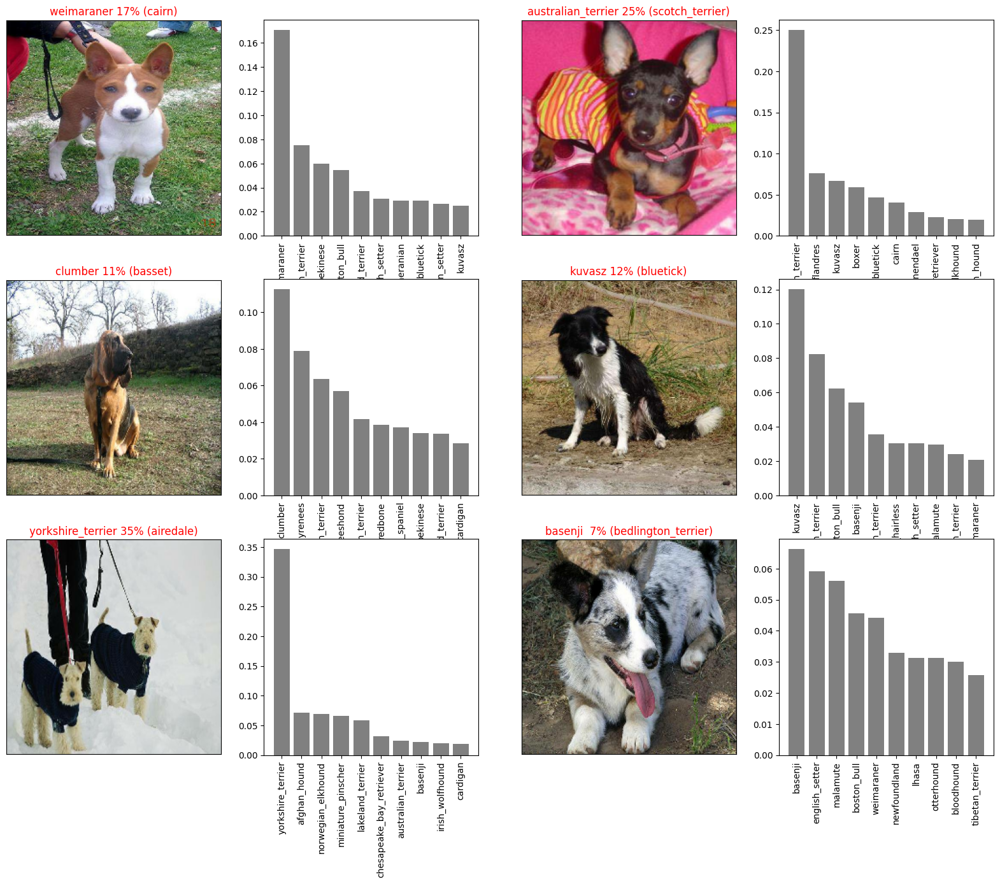

In [ ]:
# Let's check out a few predictions and their values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.show

**Challenge** how would you create a confusion matrix with our models predictions and true labels?

## Saving and reload the trained model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got a function to save and load a model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Data/models/20240110-06561704869802-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Data/models/20240110-06561704869802-1000-images-Adam.h5'

In [ ]:
# Load a trained model
model_1000_images = load_model('drive/My Drive/Data/models/20240110-06561704869802-1000-images-Adam.h5')

Loading saved model from: drive/My Drive/Data/models/20240110-06561704869802-1000-images-Adam.h5


In [ ]:
# Evaluate the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 111ms/step - loss: 6.0254 - accuracy: 0.0050


[6.025442123413086, 0.004999999888241291]

In [ ]:
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 60ms/step - loss: 6.0254 - accuracy: 0.0050


[6.025442123413086, 0.004999999888241291]

In [ ]:
## Training a big dog model(on full data)


In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with a full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No Validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note** running the cell below will take a little while(maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 32s 82ms/step - loss: 5.3938 - accuracy: 0.0075
Epoch 2/100
320/320 [==============================] - 27s 84ms/step - loss: 4.5992 - accuracy: 0.0434
Epoch 3/100
320/320 [==============================] - 27s 84ms/step - loss: 4.1927 - accuracy: 0.0866
Epoch 4/100
320/320 [==============================] - 26s 82ms/step - loss: 3.9097 - accuracy: 0.1260
Epoch 5/100
320/320 [==============================] - 25s 79ms/step - loss: 3.6839 - accuracy: 0.1644
Epoch 6/100
320/320 [==============================] - 25s 77ms/step - loss: 3.5053 - accuracy: 0.1903
Epoch 7/100
320/320 [==============================] - 26s 82ms/step - loss: 3.3501 - accuracy: 0.2166
Epoch 8/100
320/320 [==============================] - 28s 86ms/step - loss: 3.2184 - accuracy: 0.2457
Epoch 9/100
320/320 [==============================] - 28s 88ms/step - loss: 3.0931 - accuracy: 0.2711
Epoch 10/100
320/320 [==============================] - 28s 87ms/step - l

Saving and reloading the full model


In [ ]:
save_model(full_model, suffix="/content/drive/MyDrive/dog vision/models/20240110-06271704868071_1000-images-Adam.h5")

Saving model to: drive/My Drive/Data/models/20240110-09021704877326-/content/drive/MyDrive/dog vision/models/20240110-06271704868071_1000-images-Adam.h5.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Data/models/20240110-09021704877326-/content/drive/MyDrive/dog vision/models/20240110-06271704868071_1000-images-Adam.h5.h5'

In [ ]:
# Load the full model
loaded_full_model = load_model('drive/My Drive/Data/models/20240110-09021704877326-/content/drive/MyDrive/dog vision/models/20240110-06271704868071_1000-images-Adam.h5.h5')

Loading saved model from: drive/My Drive/Data/models/20240110-09021704877326-/content/drive/MyDrive/dog vision/models/20240110-06271704868071_1000-images-Adam.h5.h5


### making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created 'create_data_batches()' earlier which can take a list of file namesasinput and conver them into tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* convert the filenames into test data batches using 'create_data_batches()' and setting the test_data parameter to 'True' (since the test data does'nt have labels).
* Make predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames

test_path = "/content/drive/MyDrive/dog vision/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog vision/teste713f150e4f9fc828f8a28705755f199.jpg',
 '/content/drive/MyDrive/dog vision/teste0e3eb01e80b1d694a47b23909e158ec.jpg',
 '/content/drive/MyDrive/dog vision/teste292584f17fa7cea7f95bdadecde0ebb.jpg',
 '/content/drive/MyDrive/dog vision/teste61cd2626c01dd00117eca55fb099f5d.jpg',
 '/content/drive/MyDrive/dog vision/teste35b90290702042d17ceee2aaf2d1475.jpg',
 '/content/drive/MyDrive/dog vision/teste7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 '/content/drive/MyDrive/dog vision/teste66a91249a4979a86db48e5c64b81a88.jpg',
 '/content/drive/MyDrive/dog vision/teste752d87634c6177a748d655a55aeec89.jpg',
 '/content/drive/MyDrive/dog vision/teste1a777d181483b0982732fa4128df7f8.jpg',
 '/content/drive/MyDrive/dog vision/teste55fa0c818f485f8e36edfb464c4f129.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, None), dtype=tf.float32, name=None)>

**Note:** Calling 'predict()' on our ful model and passing it the test data batch will take a long time to run (about 1 hour )

In [ ]:
# make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                            verbose=1)

NotFoundError: Graph execution error:

Detected at node ReadFile defined at (most recent call last):
<stack traces unavailable>
Detected at node ReadFile defined at (most recent call last):
<stack traces unavailable>
2 root error(s) found.
  (0) NOT_FOUND:  /content/drive/MyDrive/dog vision/teste713f150e4f9fc828f8a28705755f199.jpg; No such file or directory
	 [[{{node ReadFile}}]]
	 [[IteratorGetNext]]
	 [[IteratorGetNext/_2]]
  (1) NOT_FOUND:  /content/drive/MyDrive/dog vision/teste713f150e4f9fc828f8a28705755f199.jpg; No such file or directory
	 [[{{node ReadFile}}]]
	 [[IteratorGetNext]]
0 successful operations.
0 derived errors ignored. [Op:__inference_predict_function_270388]